<a href="https://colab.research.google.com/github/Linda-lls/GEOG0105/blob/main/9_Spatial_regression_update.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Data Collection

In [ ]:
!pip install libpysal

In [ ]:
!pip install contextily

In [ ]:
!pip install matplotlib_scalebar

In [ ]:
!pip install spreg

In [ ]:
# import packages
import csv
import math
import pandas as pd
import numpy as np
import geopandas as gpd
import matplotlib.pyplot as plt
import contextily as ctx

from spreg import ML_Lag
from libpysal.weights import Queen
from shapely.geometry import LineString,Point
from shapely.geometry import Polygon
from matplotlib_scalebar.scalebar import ScaleBar

In [ ]:
# import average_IVW, SAIMD
av_IVW = pd.read_csv("/content/drive/MyDrive/GEOG0105/Output_1/SpatialPattern/average_IVW.csv")
SAIMD = pd.read_csv("/content/drive/MyDrive/GEOG0105/Data1/SAIMD.csv")

print(av_IVW.info())
print(SAIMD.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 130 entries, 0 to 129
Data columns (total 22 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   WARD_ID        130 non-null    int64  
 1   Gi_level_mean  130 non-null    float64
 2   Gi_level_std   130 non-null    float64
 3   Ci_level_mean  130 non-null    float64
 4   Ci_level_std   130 non-null    float64
 5   Si_level_mean  130 non-null    float64
 6   Si_level_std   130 non-null    float64
 7   Di_level_mean  130 non-null    float64
 8   Di_level_std   130 non-null    float64
 9   IVW_mean       130 non-null    float64
 10  IVW_std        130 non-null    float64
 11  OBJECTID       130 non-null    int64  
 12  PROVINCE       130 non-null    object 
 13  CAT_B          130 non-null    object 
 14  WARDNO         130 non-null    int64  
 15  SUM_WARD_P     130 non-null    float64
 16  SHAPE_LENG     130 non-null    float64
 17  WARD_EXT       130 non-null    object 
 18  ALBERS_ARE

In [ ]:
# SAIMD in JHB
SAIMD_JHB = SAIMD[SAIMD['Local Municipality Alpha Code'] == 'JHB']
print(SAIMD_JHB.info())

<class 'pandas.core.frame.DataFrame'>
Int64Index: 130 entries, 3097 to 3226
Data columns (total 19 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   wardcode                              130 non-null    int64  
 1   wardno                                130 non-null    int64  
 2   Local Municipality Code               130 non-null    int64  
 3   Local Municipality Alpha Code         130 non-null    object 
 4   Local Municipality Name               130 non-null    object 
 5   Province Code                         130 non-null    int64  
 6   Province Name                         130 non-null    object 
 7   District Alphacode                    130 non-null    object 
 8   District Name                         130 non-null    object 
 9   SAIMD 2011 Score                      130 non-null    float64
 10  SAIMD 2011 Rank                       130 non-null    int64  
 11  Material Depriv

In [ ]:
# merge two datasets
IVW_SAIMD = pd.merge(av_IVW, SAIMD_JHB, left_on='WARD_ID', right_on='wardcode')

In [ ]:
IVW_SAIMD

,WARD_ID,Gi_level_mean,Gi_level_std,Ci_level_mean,Ci_level_std,Si_level_mean,Si_level_std,Di_level_mean,Di_level_std,IVW_mean,...,SAIMD 2011 Score,SAIMD 2011 Rank,Material Deprivation Score,Material Deprivation Rank,Employment Deprivation Score,Employment Deprivation Rank,Education Deprivation Score,Education Deprivation Rank,Living Environment Deprivation Score,Living Environment Deprivation Rank
0,79800001,1.025,0.158114,5.0,0.0,1.300,0.822753,1.100,0.441443,42.125,...,77.56,2922,29.2,3071,46.7,1970,19.8,2883,30.3,2628
1,79800002,1.225,0.659740,5.0,0.0,1.000,0.000000,1.000,0.000000,41.125,...,53.61,3369,23.3,3472,45.1,2102,16.9,3176,7.4,3680
2,79800003,1.150,0.579567,5.0,0.0,1.100,0.632456,1.050,0.316228,41.500,...,74.19,2983,29.0,3085,44.6,2141,21.9,2654,23.4,2869
3,79800004,1.175,0.675107,5.0,0.0,1.125,0.647975,1.175,0.500641,42.375,...,90.72,2707,27.7,3180,51.3,1616,18.1,3049,52.5,2019
4,79800005,1.000,0.000000,5.0,0.0,1.225,0.891196,1.125,0.563301,41.750,...,98.51,2541,38.7,2196,46.3,2007,22.2,2618,42.0,2281
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
125,79800126,2.750,1.391365,5.0,0.0,1.050,0.220721,1.000,0.000000,49.000,...,5.72,4198,5.4,4196,4.9,4220,3.5,4155,4.3,3950
126,79800127,1.350,0.802240,5.0,0.0,1.075,0.474342,1.025,0.158114,42.250,...,166.85,1336,76.9,308,45.9,2029,22.9,2532,71.8,1539
127,79800128,1.000,0.000000,5.0,0.0,1.000,0.000000,1.000,0.000000,40.000,...,108.86,2323,48.7,1310,40.5,2486,21.1,2740,46.8,2155
128,79800129,1.200,0.723241,5.0,0.0,1.075,0.349908,1.050,0.316228,41.625,...,68.04,3095,31.1,2915,44.9,2115,14.8,3374,24.1,2833


In [ ]:
IVW_SAIMD.to_csv('/content/drive/MyDrive/GEOG0105/Output_1/SpatialRegression/IVW_SAIMD.csv', index=False)

# Spatial regression

In [ ]:
# Import shapfile of JHB
JHB_gdf = gpd.read_file("/content/drive/MyDrive/GEOG0105/Output_1/WD_JHB.shp")

In [ ]:
JHB_gdf = JHB_gdf.set_crs(epsg=4148)
JHB_gdf = JHB_gdf.to_crs(epsg=4148)

In [ ]:
# import csv of IVW_SAIMD_Poverty
IVW_SAIMD = pd.read_csv('/content/drive/MyDrive/GEOG0105/Output_1/SpatialRegression/IVW_SAIMD.csv')

In [ ]:
from shapely import wkt

IVW_SAIMD['geom'] = IVW_SAIMD['geometry'].apply(wkt.loads)

In [ ]:
IVW_SAIMD_gdf = gpd.GeoDataFrame(IVW_SAIMD, geometry='geom', crs='EPSG:4148')

In [ ]:
IVW_SAIMD_gdf.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 130 entries, 0 to 129
Data columns (total 42 columns):
 #   Column                                Non-Null Count  Dtype   
---  ------                                --------------  -----   
 0   WARD_ID                               130 non-null    int64   
 1   Gi_level_mean                         130 non-null    float64 
 2   Gi_level_std                          130 non-null    float64 
 3   Ci_level_mean                         130 non-null    float64 
 4   Ci_level_std                          130 non-null    float64 
 5   Si_level_mean                         130 non-null    float64 
 6   Si_level_std                          130 non-null    float64 
 7   Di_level_mean                         130 non-null    float64 
 8   Di_level_std                          130 non-null    float64 
 9   IVW_mean                              130 non-null    float64 
 10  IVW_std                               130 non-null    float64 
 11

In [ ]:
# Create Queen neighborhood weight matrix
w = Queen.from_dataframe(IVW_SAIMD_gdf)

In [ ]:
IVW_SAIMD_gdf.columns

Index(['WARD_ID', 'Gi_level_mean', 'Gi_level_std', 'Ci_level_mean',
       'Ci_level_std', 'Si_level_mean', 'Si_level_std', 'Di_level_mean',
       'Di_level_std', 'IVW_mean', 'IVW_std', 'OBJECTID', 'PROVINCE', 'CAT_B',
       'WARDNO', 'SUM_WARD_P', 'SHAPE_LENG', 'WARD_EXT', 'ALBERS_ARE',
       'SHAPE_Le_1', 'SHAPE_Area', 'geometry', 'wardcode', 'wardno',
       'Local Municipality Code', 'Local Municipality Alpha Code',
       'Local Municipality Name', 'Province Code', 'Province Name',
       'District Alphacode', 'District Name', 'SAIMD 2011 Score',
       'SAIMD 2011 Rank', 'Material Deprivation Score',
       'Material Deprivation Rank', 'Employment Deprivation Score',
       'Employment Deprivation Rank', 'Education Deprivation Score',
       'Education Deprivation Rank', 'Living Environment Deprivation Score',
       'Living Environment Deprivation Rank', 'geom'],
      dtype='object')

In [ ]:
## Spatial Lag Model
# IVW - Material Deprivation
y = np.array(IVW_SAIMD_gdf['IVW_mean'])
X1 = np.array(IVW_SAIMD_gdf[['Material Deprivation Score']])

lag_model1 = ML_Lag(y, X1, w=w, name_y='IVW', name_x=['Material Deprivation'])
lag_model1.summary

/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:892: RuntimeWarning: Method 'bounded' does not support relative tolerance in x; defaulting to absolute tolerance.
  warn("Method 'bounded' does not support relative tolerance in x; "


'REGRESSION\n----------\nSUMMARY OF OUTPUT: MAXIMUM LIKELIHOOD SPATIAL LAG (METHOD = FULL)\n-----------------------------------------------------------------\nData set            :     unknown\nWeights matrix      :     unknown\nDependent Variable  :         IVW                Number of Observations:         130\nMean dependent var  :     44.4788                Number of Variables   :           3\nS.D. dependent var  :      4.2395                Degrees of Freedom    :         127\nPseudo R-squared    :      0.2572\nSpatial Pseudo R-squared:  0.1840\nSigma-square ML     :      13.249                Log likelihood        :    -352.472\nS.E of regression   :       3.640                Akaike info criterion :     710.944\n                                                 Schwarz criterion     :     719.547\n\n------------------------------------------------------------------------------------\n            Variable     Coefficient       Std.Error     z-Statistic     Probability\n-----------

In [ ]:
# IVW - Employment Deprivation
y = np.array(IVW_SAIMD_gdf['IVW_mean'])
X2 = np.array(IVW_SAIMD_gdf[['Employment Deprivation Score']])

lag_model2 = ML_Lag(y, X2, w=w, name_y='IVW', name_x=['Employment Deprivation'])
lag_model2.summary

/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:892: RuntimeWarning: Method 'bounded' does not support relative tolerance in x; defaulting to absolute tolerance.
  warn("Method 'bounded' does not support relative tolerance in x; "


'REGRESSION\n----------\nSUMMARY OF OUTPUT: MAXIMUM LIKELIHOOD SPATIAL LAG (METHOD = FULL)\n-----------------------------------------------------------------\nData set            :     unknown\nWeights matrix      :     unknown\nDependent Variable  :         IVW                Number of Observations:         130\nMean dependent var  :     44.4788                Number of Variables   :           3\nS.D. dependent var  :      4.2395                Degrees of Freedom    :         127\nPseudo R-squared    :      0.6722\nSpatial Pseudo R-squared:  0.6642\nSigma-square ML     :       5.846                Log likelihood        :    -299.254\nS.E of regression   :       2.418                Akaike info criterion :     604.509\n                                                 Schwarz criterion     :     613.111\n\n------------------------------------------------------------------------------------\n            Variable     Coefficient       Std.Error     z-Statistic     Probability\n-----------

In [ ]:
# IVW - Education Deprivation
y = np.array(IVW_SAIMD_gdf['IVW_mean'])
X3 = np.array(IVW_SAIMD_gdf[['Education Deprivation Score']])

lag_model3 = ML_Lag(y, X3, w=w, name_y='IVW', name_x=['Education Deprivation'])
lag_model3.summary

/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:892: RuntimeWarning: Method 'bounded' does not support relative tolerance in x; defaulting to absolute tolerance.
  warn("Method 'bounded' does not support relative tolerance in x; "


'REGRESSION\n----------\nSUMMARY OF OUTPUT: MAXIMUM LIKELIHOOD SPATIAL LAG (METHOD = FULL)\n-----------------------------------------------------------------\nData set            :     unknown\nWeights matrix      :     unknown\nDependent Variable  :         IVW                Number of Observations:         130\nMean dependent var  :     44.4788                Number of Variables   :           3\nS.D. dependent var  :      4.2395                Degrees of Freedom    :         127\nPseudo R-squared    :      0.3975\nSpatial Pseudo R-squared:  0.3657\nSigma-square ML     :      10.745                Log likelihood        :    -338.822\nS.E of regression   :       3.278                Akaike info criterion :     683.643\n                                                 Schwarz criterion     :     692.246\n\n------------------------------------------------------------------------------------\n            Variable     Coefficient       Std.Error     z-Statistic     Probability\n-----------

In [ ]:
# IVW - Living Environment Deprivation
y = np.array(IVW_SAIMD_gdf['IVW_mean'])
X4 = np.array(IVW_SAIMD_gdf[['Living Environment Deprivation Score']])

lag_model4 = ML_Lag(y, X4, w=w, name_y='IVW', name_x=['Living Environment Deprivation'])
lag_model4.summary

/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:892: RuntimeWarning: Method 'bounded' does not support relative tolerance in x; defaulting to absolute tolerance.
  warn("Method 'bounded' does not support relative tolerance in x; "


'REGRESSION\n----------\nSUMMARY OF OUTPUT: MAXIMUM LIKELIHOOD SPATIAL LAG (METHOD = FULL)\n-----------------------------------------------------------------\nData set            :     unknown\nWeights matrix      :     unknown\nDependent Variable  :         IVW                Number of Observations:         130\nMean dependent var  :     44.4788                Number of Variables   :           3\nS.D. dependent var  :      4.2395                Degrees of Freedom    :         127\nPseudo R-squared    :      0.2216\nSpatial Pseudo R-squared:  0.1413\nSigma-square ML     :      13.884                Log likelihood        :    -355.519\nS.E of regression   :       3.726                Akaike info criterion :     717.039\n                                                 Schwarz criterion     :     725.641\n\n------------------------------------------------------------------------------------\n            Variable     Coefficient       Std.Error     z-Statistic     Probability\n-----------

# Visaulization

In [ ]:
# calculate the distance in meters of two points with the same latitude which are one full degree of longitud apart
latitude = -26.5
longitude1 = 27.7
longitude2 = 28.7

# Convert longitude to radians
lat_radians = latitude * (3.141592653589793 / 180.0)

distance = abs(longitude2 - longitude1) * (111.32 * abs(math.cos(lat_radians)))

distance

99.62409313353743

## Material Deprivation

In [ ]:
top_10_max_material = IVW_SAIMD.nlargest(10, 'Material Deprivation Score')[['WARD_ID', 'Material Deprivation Score']]

top_10_min_material = IVW_SAIMD.nsmallest(10, 'Material Deprivation Score')[['WARD_ID','Material Deprivation Score']]

print("Top 10 max Material Deprivation Score correspond to WARD_ID:")
print(top_10_max_material)

print("\nTop 10 min Material Deprivation Score correspond to WARD_ID:")
print(top_10_min_material)

Top 10 max Material Deprivation Score correspond to WARD_ID:
      WARD_ID  Material Deprivation Score
94   79800095                        82.5
7    79800008                        79.2
126  79800127                        76.9
64   79800065                        68.7
79   79800080                        62.0
23   79800024                        60.1
112  79800113                        58.2
5    79800006                        56.7
78   79800079                        54.7
113  79800114                        52.5

Top 10 min Material Deprivation Score correspond to WARD_ID:
      WARD_ID  Material Deprivation Score
100  79800101                         4.4
92   79800093                         4.7
125  79800126                         5.4
82   79800083                         5.5
114  79800115                         5.7
53   79800054                         6.3
88   79800089                         6.5
93   79800094                         6.6
22   79800023                        

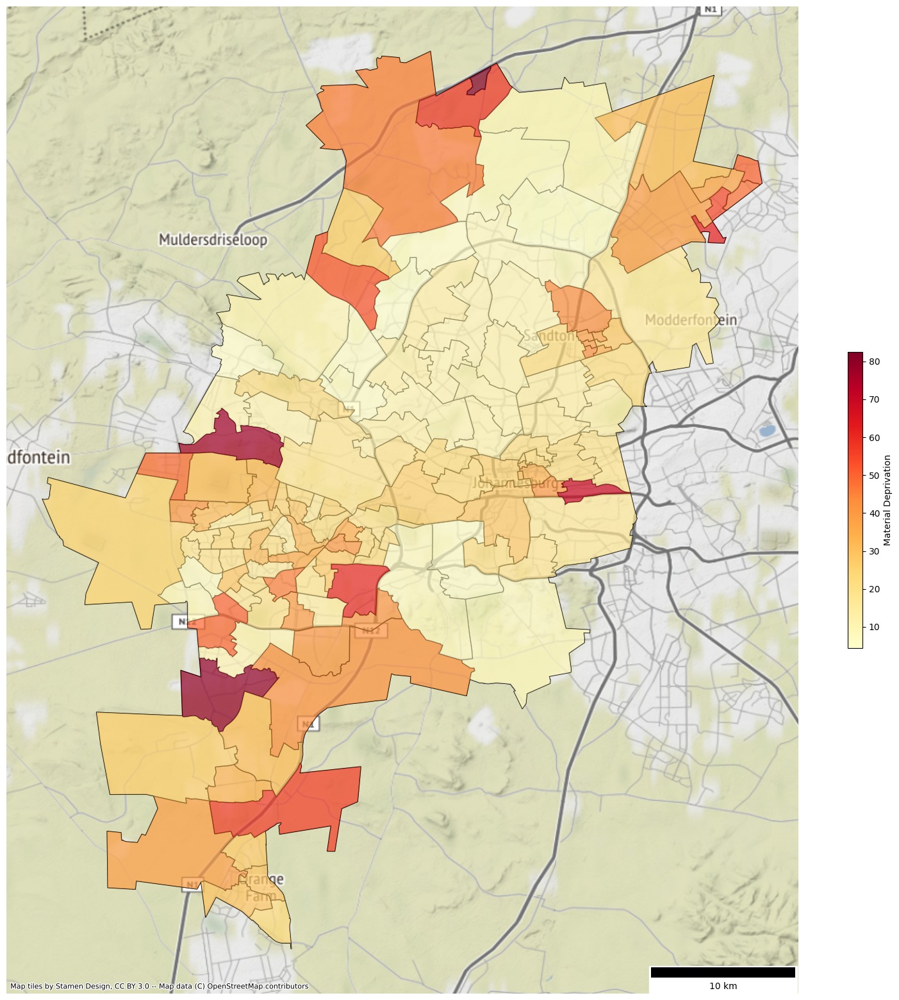

In [ ]:
# Material Deprivation

fig, ax = plt.subplots(figsize=(20, 20))

# plot JHB outline
JHB_gdf.plot(ax=ax, facecolor='none', edgecolor='black')

# plot Material Deprivation
IVW_SAIMD_gdf.plot(column='Material Deprivation Score', cmap='YlOrRd', alpha=0.7, ax=ax, legend=True, legend_kwds={'label': "Material Deprivation", 'orientation': "vertical", 'shrink': 0.3})

# add basemap
ctx.add_basemap(ax, crs=IVW_SAIMD_gdf.crs, source=ctx.providers.Stamen.Terrain)

# add saclebar
ax.add_artist(ScaleBar(distance, location='lower right', units='km'))

plt.axis('off')
plt.show()

## Employment Deprivation

In [ ]:
top_10_max_employment = IVW_SAIMD.nlargest(10, 'Employment Deprivation Score')[['WARD_ID', 'Employment Deprivation Score']]

top_10_min_employment = IVW_SAIMD.nsmallest(10, 'Employment Deprivation Score')[['WARD_ID','Employment Deprivation Score']]

print("Top 10 max Employment Deprivation Score correspond to WARD_ID:")
print(top_10_max_employment)

print("\nTop 10 min Employment Deprivation Score correspond to WARD_ID:")
print(top_10_min_employment)

Top 10 max Employment Deprivation Score correspond to WARD_ID:
      WARD_ID  Employment Deprivation Score
3    79800004                          51.3
29   79800030                          50.3
36   79800037                          49.4
49   79800050                          49.3
34   79800035                          48.6
14   79800015                          47.3
0    79800001                          46.7
4    79800005                          46.3
25   79800026                          46.0
126  79800127                          45.9

Top 10 min Employment Deprivation Score correspond to WARD_ID:
      WARD_ID  Employment Deprivation Score
93   79800094                           3.3
86   79800087                           3.5
105  79800106                           3.6
114  79800115                           3.7
116  79800117                           3.7
89   79800090                           3.8
102  79800103                           3.9
100  79800101                        

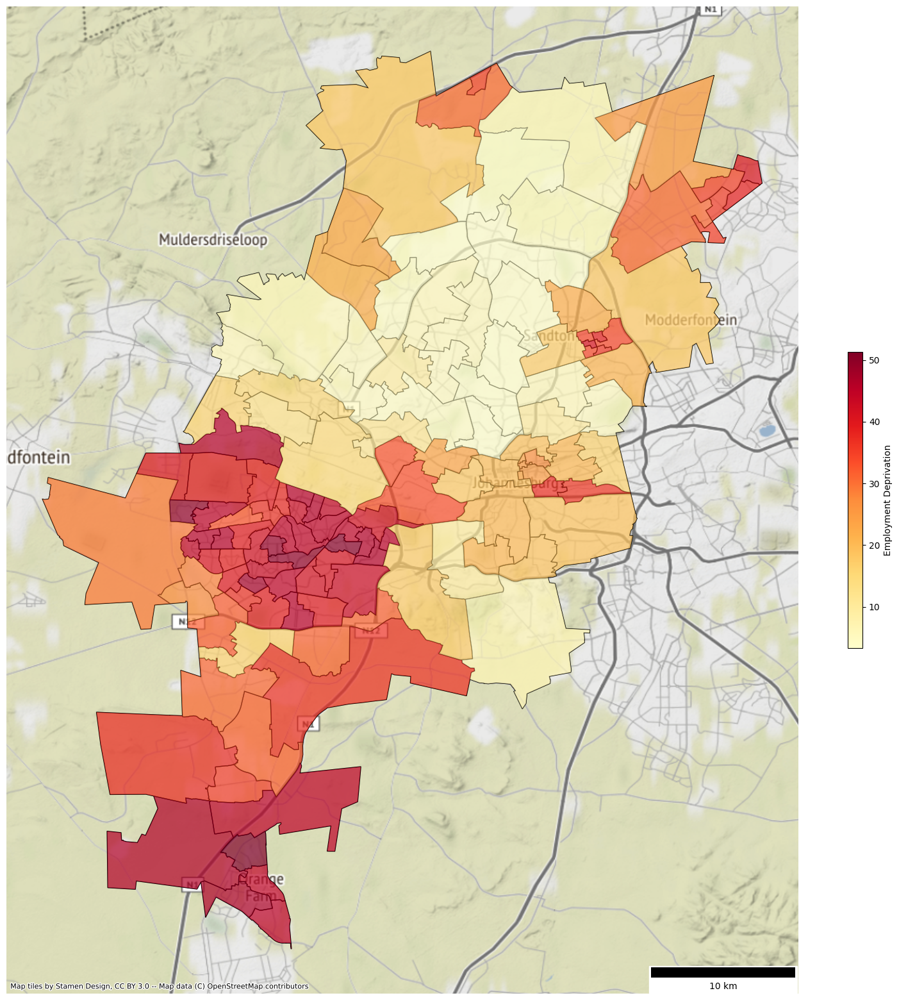

In [ ]:
# Employment Deprivation

fig, ax = plt.subplots(figsize=(20, 20))

# plot JHB outline
JHB_gdf.plot(ax=ax, facecolor='none', edgecolor='black')

# plot Employment Deprivation
IVW_SAIMD_gdf.plot(column='Employment Deprivation Score', cmap='YlOrRd', alpha=0.7, ax=ax, legend=True, legend_kwds={'label': "Employment Deprivation", 'orientation': "vertical", 'shrink': 0.3})

# add basemap
ctx.add_basemap(ax, crs=IVW_SAIMD_gdf.crs, source=ctx.providers.Stamen.Terrain)

# add saclebar
ax.add_artist(ScaleBar(distance, location='lower right', units='km'))

plt.axis('off')
plt.show()

## Education Deprivation

In [ ]:
top_10_max_education = IVW_SAIMD.nlargest(10, 'Education Deprivation Score')[['WARD_ID', 'Education Deprivation Score']]

top_10_min_education = IVW_SAIMD.nsmallest(10, 'Education Deprivation Score')[['WARD_ID','Education Deprivation Score']]

print("Top 10 max Education Deprivation Score correspond to WARD_ID:")
print(top_10_max_education)

print("\nTop 10 min Education Deprivation Score correspond to WARD_ID:")
print(top_10_min_education)

Top 10 max Education Deprivation Score correspond to WARD_ID:
      WARD_ID  Education Deprivation Score
5    79800006                         24.5
126  79800127                         22.9
7    79800008                         22.3
4    79800005                         22.2
2    79800003                         21.9
127  79800128                         21.1
121  79800122                         20.6
94   79800095                         20.2
77   79800078                         20.1
0    79800001                         19.8

Top 10 min Education Deprivation Score correspond to WARD_ID:
      WARD_ID  Education Deprivation Score
92   79800093                          2.3
100  79800101                          2.8
114  79800115                          3.1
124  79800125                          3.5
125  79800126                          3.5
111  79800112                          3.7
96   79800097                          4.0
88   79800089                          4.3
53   79800054  

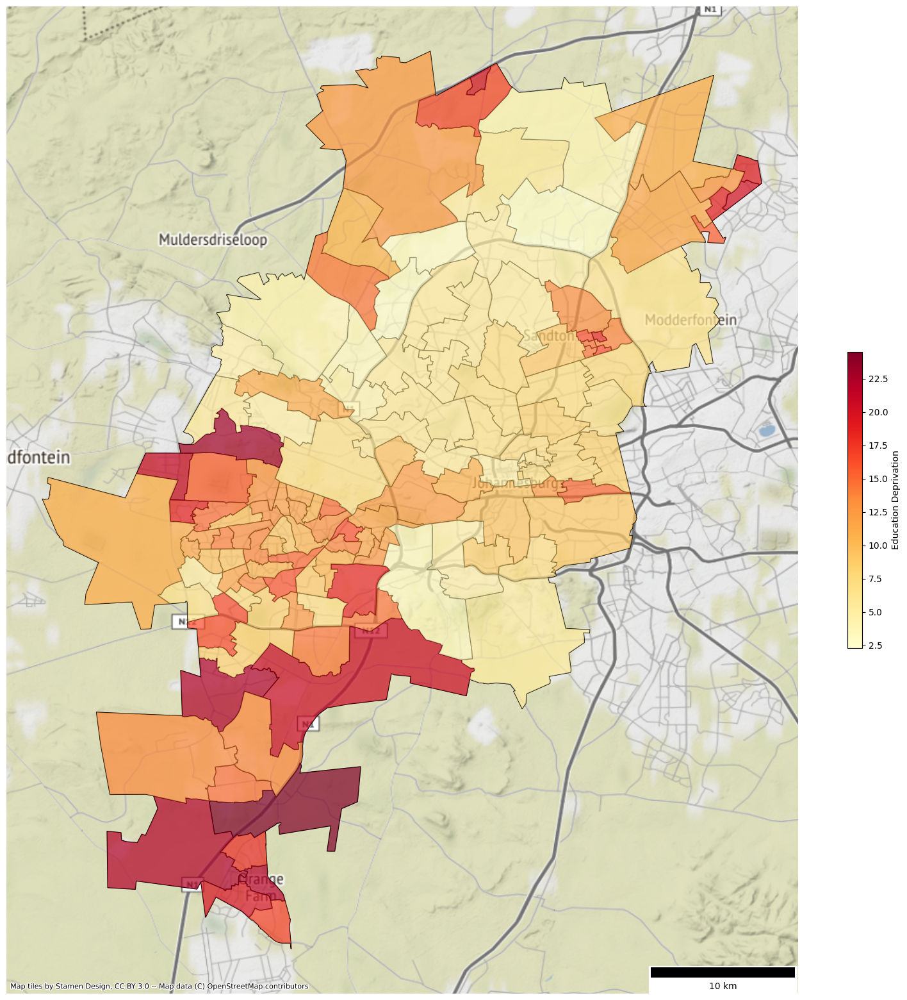

In [ ]:
# Education Deprivation

fig, ax = plt.subplots(figsize=(20, 20))

# plot JHB outline
JHB_gdf.plot(ax=ax, facecolor='none', edgecolor='black')

# plot Education Deprivation
IVW_SAIMD_gdf.plot(column='Education Deprivation Score', cmap='YlOrRd', alpha=0.7, ax=ax, legend=True, legend_kwds={'label': "Education Deprivation", 'orientation': "vertical", 'shrink': 0.3})

# add basemap
ctx.add_basemap(ax, crs=IVW_SAIMD_gdf.crs, source=ctx.providers.Stamen.Terrain)

# add saclebar
ax.add_artist(ScaleBar(distance, location='lower right', units='km'))

plt.axis('off')
plt.show()

## Living Environment Deprivation

In [ ]:
top_10_max_living = IVW_SAIMD.nlargest(10, 'Living Environment Deprivation Score')[['WARD_ID', 'Living Environment Deprivation Score']]

top_10_min_living = IVW_SAIMD.nsmallest(10, 'Living Environment Deprivation Score')[['WARD_ID','Living Environment Deprivation Score']]

print("Top 10 max Living Environment Deprivation Score correspond to WARD_ID:")
print(top_10_max_living)

print("\nTop 10 min Living Environment Deprivation Score correspond to WARD_ID:")
print(top_10_min_living)

Top 10 max Living Environment Deprivation Score correspond to WARD_ID:
      WARD_ID  Living Environment Deprivation Score
94   79800095                                  85.4
5    79800006                                  72.0
126  79800127                                  71.8
7    79800008                                  69.7
113  79800114                                  59.6
23   79800024                                  57.4
79   79800080                                  54.2
3    79800004                                  52.5
120  79800121                                  50.0
112  79800113                                  48.4

Top 10 min Living Environment Deprivation Score correspond to WARD_ID:
      WARD_ID  Living Environment Deprivation Score
58   79800059                                   2.0
98   79800099                                   2.1
61   79800062                                   2.3
62   79800063                                   2.5
12   79800013            

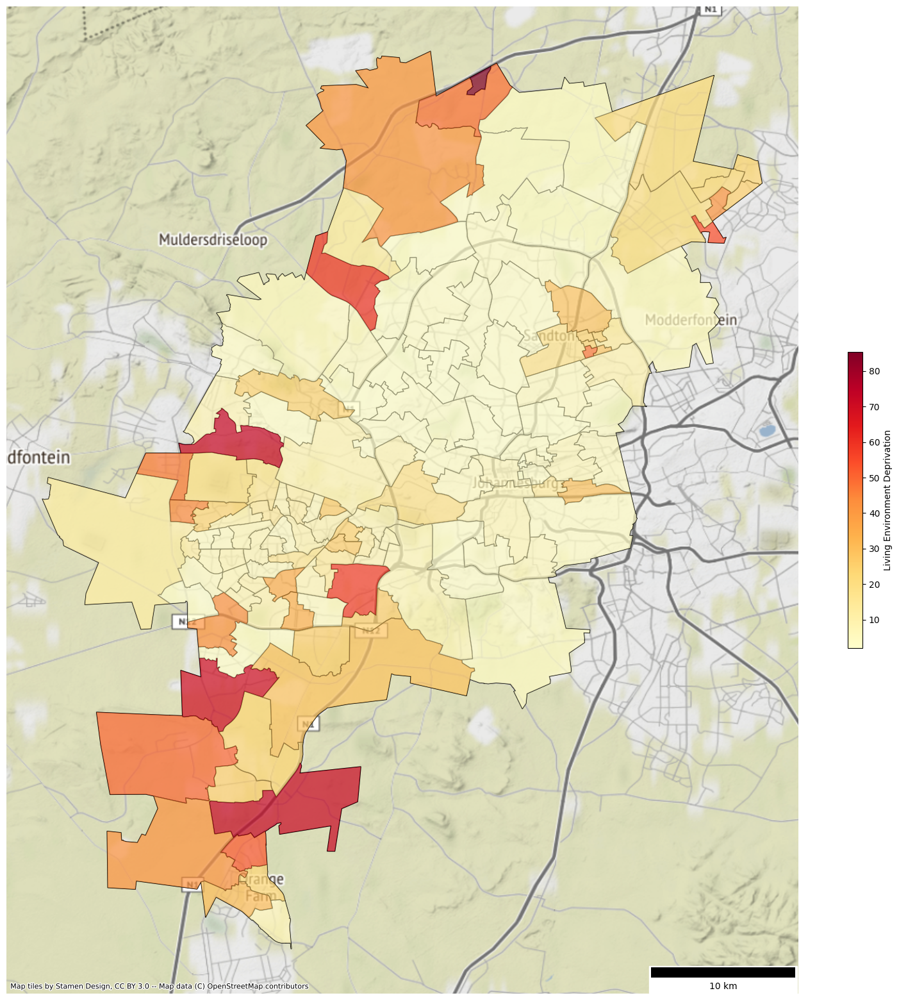

In [ ]:
# Living Environment Deprivation

fig, ax = plt.subplots(figsize=(20, 20))

# plot JHB outline
JHB_gdf.plot(ax=ax, facecolor='none', edgecolor='black')

# plot Living Environment Deprivation
IVW_SAIMD_gdf.plot(column='Living Environment Deprivation Score', cmap='YlOrRd', alpha=0.7, ax=ax, legend=True, legend_kwds={'label': "Living Environment Deprivation", 'orientation': "vertical", 'shrink': 0.3})

# add basemap
ctx.add_basemap(ax, crs=IVW_SAIMD_gdf.crs, source=ctx.providers.Stamen.Terrain)

# add saclebar
ax.add_artist(ScaleBar(distance, location='lower right', units='km'))

plt.axis('off')
plt.show()